# Import Package

In [ ]:
!pip install opencage

In [ ]:
import pandas as pd
import requests
from opencage.geocoder import OpenCageGeocode

# Mencari Titik Koordinat

In [ ]:
df = pd.read_excel('Daftar Alamat Perguruan Tinggi.xlsx')
df

,Daftar Alamat Perguruan Tinggi,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6
0,Kode PT,Nama PT,Jalan,No Telepon dan Faksmil,Email,Website,Wilayah
1,051001,Universitas Islam Indonesia,"Jalan Kaliurang Km 14,5 Sleman - 55584",T: 0274-898444 F: 0274-898459,rektorat@uii.ac.id,www.uii.ac.id,Kabupaten Sleman
2,051002,Universitas Sarjanawiyata Tamansiswa,"Jalan Kusumanegara No 157, Yogyakarta - 55165",T: 0274375637 F: 0274-547042,humas@ustjogja.ac.id,www.ustjogja.ac.id,Kota Yogyakarta
3,051003,Universitas Janabadra,Jl Tentara Rakyat Mataram 55 - 55231,T: (0274)561039 F: (0274)561039,info@janabadra.ac.id,www.janabadra.ac.id,Kota Yogyakarta
4,051004,Universitas Proklamasi 45,Jalan Proklamasi No 1 Babarsari - 55281,"T: 0274-485517, 485535 F: 0274-486008",info@up45.ac.id,up45.ac.id,Kabupaten Sleman
...,...,...,...,...,...,...,...
98,055012,Politeknik Kesehatan Karya Husada Yogyakarta,Jl. Tentara Rakyat Mataram No. 11-B -,T: (0274) 587 677 F: (0274) 587677,poltekkeskhjogja@gmail.com,poltekkeskhjogja.ac.id,Kota Yogyakarta
99,055013,Politeknik Kesehatan Ummi Khasanah,"Jalan Pemuda, Gandekan, Bantul - 55711",T: (0274)368055 F: (0274)368055,poltekkesummikha@gmail.com,www.ummikha.ac.id,Kabupaten Bantul
100,055014,Politeknik YKPN,-,T: 0274 513413 F: 0274 561591,poltekykpn@poltekykpn.ac.id,poltekykpn.ac.id,Kota Yogyakarta
101,055015,Politeknik Gistrav,-,T: F:,NaN,NaN,Kabupaten Sleman


In [ ]:
import pandas as pd
import requests
from opencage.geocoder import OpenCageGeocode


api_key = '2daee37de3084859b4967169c7c02ff4'

# Baca file Excel
df = pd.read_excel('Daftar Alamat Perguruan Tinggi.xlsx')

# Tambahkan kolom baru untuk menyimpan hasil geocoding
df['Latitude'] = None
df['Longitude'] = None
df['Coordinate_1'] = None

# Fungsi untuk melakukan geocoding
def geocode(address, api_key):
    url = f'https://api.opencagedata.com/geocode/v1/json?q={address}&key={api_key}'
    response = requests.get(url)
    if response.status_code == 200:
        data = response.json()
        if 'results' in data and len(data['results']) > 0:
            location = data['results'][0]['geometry']
            return location['lat'], location['lng']
    return None, None

# Iterasi melalui setiap alamat dalam kolom 'Nama Kampus'
for idx, row in df.iterrows():
    address_1 = row['Unnamed: 1']
    lat_1, lng_1 = geocode(address_1, api_key)
    if lat_1 is not None and lng_1 is not None:
        df.at[idx, 'Coordinate_1'] = f'{lat_1}, {lng_1}'
        # df.at[idx, 'Longitude'] = lng
    else:
      df.at[idx, 'Coordinate_1'] = None
    # df.at[idx, 'Latitude'] = lat
    # df.at[idx, 'Latitude'] = lat
    # df.at[idx, 'Longitude'] = lng

# Simpan hasilnya kembali ke file Excel
df.to_excel('data_with_coordinate.xlsx', index=False)

print("Geocoding selesai. Hasil disimpan dalam file 'data_with_geocode.xlsx'.")

Geocoding selesai. Hasil disimpan dalam file 'data_with_geocode.xlsx'.


# Data Cleaning and Pre-processing

In [ ]:
#Setelah didapat koordinat nya menggunakan APIkey Geocode,akan dilihat hasil data nya

df = pd.read_excel('data_with_coordinate.xlsx')
df

,Daftar Alamat Perguruan Tinggi,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Latitude,Longitude,Coordinate_1
0,Kode PT,Nama PT,Jalan,No Telepon dan Faksmil,Email,Website,Wilayah,NaN,NaN,"18.0276057, 104.1428669"
1,051001,Universitas Islam Indonesia,"Jalan Kaliurang Km 14,5 Sleman - 55584",T: 0274-898444 F: 0274-898459,rektorat@uii.ac.id,www.uii.ac.id,Kabupaten Sleman,NaN,NaN,"-7.6880648, 110.41383"
2,051002,Universitas Sarjanawiyata Tamansiswa,"Jalan Kusumanegara No 157, Yogyakarta - 55165",T: 0274375637 F: 0274-547042,humas@ustjogja.ac.id,www.ustjogja.ac.id,Kota Yogyakarta,NaN,NaN,"-7.8009806, 110.3878711"
3,051003,Universitas Janabadra,Jl Tentara Rakyat Mataram 55 - 55231,T: (0274)561039 F: (0274)561039,info@janabadra.ac.id,www.janabadra.ac.id,Kota Yogyakarta,NaN,NaN,"-7.7838736, 110.357369"
4,051004,Universitas Proklamasi 45,Jalan Proklamasi No 1 Babarsari - 55281,"T: 0274-485517, 485535 F: 0274-486008",info@up45.ac.id,up45.ac.id,Kabupaten Sleman,NaN,NaN,"-7.7743727, 110.4180807"
...,...,...,...,...,...,...,...,...,...,...
98,055012,Politeknik Kesehatan Karya Husada Yogyakarta,Jl. Tentara Rakyat Mataram No. 11-B -,T: (0274) 587 677 F: (0274) 587677,poltekkeskhjogja@gmail.com,poltekkeskhjogja.ac.id,Kota Yogyakarta,NaN,NaN,"-7.78278, 110.36083"
99,055013,Politeknik Kesehatan Ummi Khasanah,"Jalan Pemuda, Gandekan, Bantul - 55711",T: (0274)368055 F: (0274)368055,poltekkesummikha@gmail.com,www.ummikha.ac.id,Kabupaten Bantul,NaN,NaN,NaN
100,055014,Politeknik YKPN,-,T: 0274 513413 F: 0274 561591,poltekykpn@poltekykpn.ac.id,poltekykpn.ac.id,Kota Yogyakarta,NaN,NaN,NaN
101,055015,Politeknik Gistrav,-,T: F:,NaN,NaN,Kabupaten Sleman,NaN,NaN,NaN


In [ ]:
#Kita gunakan metode (=TEXTSPLIT) di excel untuk memecah koordinat menjadi Latitude dan Longitude

In [ ]:
df = pd.read_excel('data_with_coordinate (FULL).xlsx')
df

,Daftar Alamat Perguruan Tinggi,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Latitude,Longitude,Coordinate_1
0,Kode PT,Nama PT,Jalan,No Telepon dan Faksmil,Email,Website,Wilayah,18.027606,104.142867,"18.0276057, 104.1428669"
1,051001,Universitas Islam Indonesia,"Jalan Kaliurang Km 14,5 Sleman - 55584",T: 0274-898444 F: 0274-898459,rektorat@uii.ac.id,www.uii.ac.id,Kabupaten Sleman,-7.688065,110.413830,"-7.6880648, 110.41383"
2,051002,Universitas Sarjanawiyata Tamansiswa,"Jalan Kusumanegara No 157, Yogyakarta - 55165",T: 0274375637 F: 0274-547042,humas@ustjogja.ac.id,www.ustjogja.ac.id,Kota Yogyakarta,-7.800981,110.387871,"-7.8009806, 110.3878711"
3,051003,Universitas Janabadra,Jl Tentara Rakyat Mataram 55 - 55231,T: (0274)561039 F: (0274)561039,info@janabadra.ac.id,www.janabadra.ac.id,Kota Yogyakarta,-7.783874,110.357369,"-7.7838736, 110.357369"
4,051004,Universitas Proklamasi 45,Jalan Proklamasi No 1 Babarsari - 55281,"T: 0274-485517, 485535 F: 0274-486008",info@up45.ac.id,up45.ac.id,Kabupaten Sleman,-7.774373,110.418081,"-7.7743727, 110.4180807"
...,...,...,...,...,...,...,...,...,...,...
98,055012,Politeknik Kesehatan Karya Husada Yogyakarta,Jl. Tentara Rakyat Mataram No. 11-B -,T: (0274) 587 677 F: (0274) 587677,poltekkeskhjogja@gmail.com,poltekkeskhjogja.ac.id,Kota Yogyakarta,-7.782780,110.360830,"-7.78278, 110.36083"
99,055013,Politeknik Kesehatan Ummi Khasanah,"Jalan Pemuda, Gandekan, Bantul - 55711",T: (0274)368055 F: (0274)368055,poltekkesummikha@gmail.com,www.ummikha.ac.id,Kabupaten Bantul,-7.877590,110.325841,"-7.877590488598886, 110.32584051613166"
100,055014,Politeknik YKPN,-,T: 0274 513413 F: 0274 561591,poltekykpn@poltekykpn.ac.id,poltekykpn.ac.id,Kota Yogyakarta,-7.784541,110.383612,"-7.784540644987981, 110.38361226983217"
101,055015,Politeknik Gistrav,-,T: F:,NaN,NaN,Kabupaten Sleman,-7.720267,110.379967,"-7.720267026059608, 110.37996718497496"


In [ ]:
# cek apakah ada NaN di kolom "Latitude" dan "Longitude"

import pandas as pd

df = pd.read_excel('data_with_coordinate (FULL).xlsx')

# Check for missing values in Latitude and Longitude columns
missing_lat = df['Latitude'].isnull().any()
missing_lng = df['Longitude'].isnull().any()

# Print the results
print(f"Missing values in Latitude: {missing_lat}")
print(f"Missing values in Longitude: {missing_lng}")


Missing values in Latitude: False
Missing values in Longitude: False


In [ ]:
#Karena sudah aman ingin kita cek
#apakah koordinat yang telah di generate oleh Geocode sudah tepat berada di Provinsi DI Yogykarta


#IMPORT FOLIUM
import folium
import pandas as pd

df= df.dropna(subset=['Latitude'])

# Buat peta dengan pusat di koordinat rata-rata
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
map = folium.Map(location=map_center, zoom_start=12)

# Tambahkan marker untuk setiap lokasi dalam DataFrame
for idx, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['Unnamed: 1']
    ).add_to(map)

# Tampilkan peta
map.save("mapJogja.html")

# Untuk menampilkan peta dalam Jupyter Notebook
# map

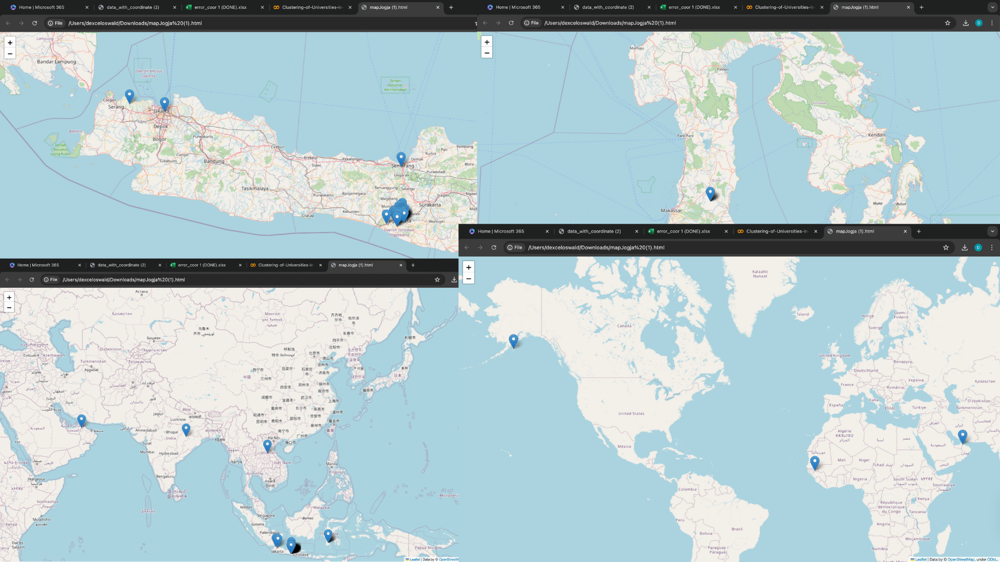

In [ ]:
#Karena ada beberapa yang masih di luar Provinsi DI-Yogyakarta perlu kita rapihkan secara manual



In [ ]:
df = pd.read_excel('data_with_coordinate (No Outliers).xlsx')
df

,Daftar Alamat Perguruan Tinggi,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Latitude,Longitude,Coordinate_1,Unnamed: 10
0,Kode PT,Nama PT,Jalan,No Telepon dan Faksmil,Email,Website,Wilayah,-7.687399,110.414229,"-7.687399164064613, 110.41422929256589","-7.687399164064613, 110.41422929256589"
1,051001,Universitas Islam Indonesia,"Jalan Kaliurang Km 14,5 Sleman - 55584",T: 0274-898444 F: 0274-898459,rektorat@uii.ac.id,www.uii.ac.id,Kabupaten Sleman,-7.687399,110.414229,"-7.687399164064613, 110.41422929256589",NaN
2,051002,Universitas Sarjanawiyata Tamansiswa,"Jalan Kusumanegara No 157, Yogyakarta - 55165",T: 0274375637 F: 0274-547042,humas@ustjogja.ac.id,www.ustjogja.ac.id,Kota Yogyakarta,-7.808163,110.381707,"-7.80816287383261, 110.38170692678092",NaN
3,051003,Universitas Janabadra,Jl Tentara Rakyat Mataram 55 - 55231,T: (0274)561039 F: (0274)561039,info@janabadra.ac.id,www.janabadra.ac.id,Kota Yogyakarta,-7.783770,110.357353,"-7.783769994829268, 110.35735301175718",NaN
4,051004,Universitas Proklamasi 45,Jalan Proklamasi No 1 Babarsari - 55281,"T: 0274-485517, 485535 F: 0274-486008",info@up45.ac.id,up45.ac.id,Kabupaten Sleman,-7.774249,110.415992,"-7.7742487827523785, 110.41599196151685",NaN
...,...,...,...,...,...,...,...,...,...,...,...
98,055012,Politeknik Kesehatan Karya Husada Yogyakarta,Jl. Tentara Rakyat Mataram No. 11-B -,T: (0274) 587 677 F: (0274) 587677,poltekkeskhjogja@gmail.com,poltekkeskhjogja.ac.id,Kota Yogyakarta,-7.784766,110.356724,"-7.784766405319381, 110.35672369819964",NaN
99,055013,Politeknik Kesehatan Ummi Khasanah,"Jalan Pemuda, Gandekan, Bantul - 55711",T: (0274)368055 F: (0274)368055,poltekkesummikha@gmail.com,www.ummikha.ac.id,Kabupaten Bantul,-7.877590,110.325841,"-7.877590488598886, 110.32584051613166",NaN
100,055014,Politeknik YKPN,-,T: 0274 513413 F: 0274 561591,poltekykpn@poltekykpn.ac.id,poltekykpn.ac.id,Kota Yogyakarta,-7.784541,110.383612,"-7.784540644987981, 110.38361226983217",NaN
101,055015,Politeknik Gistrav,-,T: F:,NaN,NaN,Kabupaten Sleman,-7.720267,110.379967,"-7.720267026059608, 110.37996718497496",NaN


In [ ]:
#Kita Cek di Map apakah sudah di Provinsi DI-Yogyakrta semua

#IMPORT FOLIUM
import folium
import pandas as pd

df= df.dropna(subset=['Latitude'])

# Buat peta dengan pusat di koordinat rata-rata
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
map = folium.Map(location=map_center, zoom_start=12)

# Tambahkan marker untuk setiap lokasi dalam DataFrame
for idx, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['Unnamed: 1']
    ).add_to(map)

# Tampilkan peta
map.save("mapJogja(CEK).html")

# Untuk menampilkan peta dalam Jupyter Notebook
# map

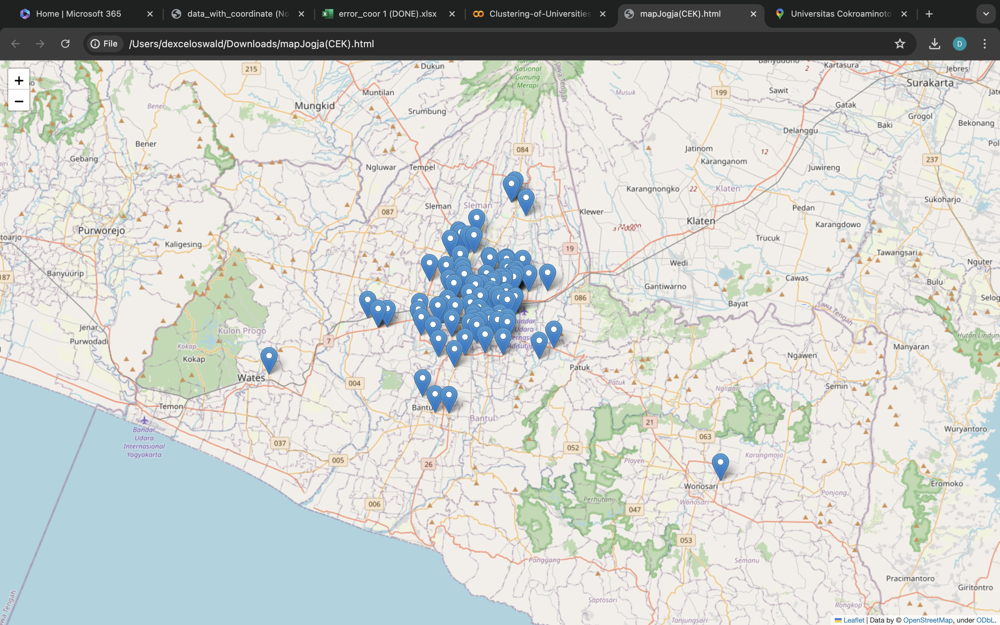

Karena sudah benar datanya, di Provinsi DI Yogyakarta semua maka bisa kita clustering

# Clustering

In [33]:
!pip install folium

In [34]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

In [37]:
missing_values = df.isnull().sum()
print(missing_values)


Daftar Alamat Perguruan Tinggi      0
Unnamed: 1                          0
Unnamed: 2                          0
Unnamed: 3                          0
Unnamed: 4                          2
Unnamed: 5                          3
Unnamed: 6                          0
Latitude                            0
Longitude                           0
Coordinate_1                        0
Unnamed: 10                       102
dtype: int64


In [38]:
df

,Daftar Alamat Perguruan Tinggi,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Latitude,Longitude,Coordinate_1,Unnamed: 10
0,Kode PT,Nama PT,Jalan,No Telepon dan Faksmil,Email,Website,Wilayah,-7.687399,110.414229,"-7.687399164064613, 110.41422929256589","-7.687399164064613, 110.41422929256589"
1,051001,Universitas Islam Indonesia,"Jalan Kaliurang Km 14,5 Sleman - 55584",T: 0274-898444 F: 0274-898459,rektorat@uii.ac.id,www.uii.ac.id,Kabupaten Sleman,-7.687399,110.414229,"-7.687399164064613, 110.41422929256589",NaN
2,051002,Universitas Sarjanawiyata Tamansiswa,"Jalan Kusumanegara No 157, Yogyakarta - 55165",T: 0274375637 F: 0274-547042,humas@ustjogja.ac.id,www.ustjogja.ac.id,Kota Yogyakarta,-7.808163,110.381707,"-7.80816287383261, 110.38170692678092",NaN
3,051003,Universitas Janabadra,Jl Tentara Rakyat Mataram 55 - 55231,T: (0274)561039 F: (0274)561039,info@janabadra.ac.id,www.janabadra.ac.id,Kota Yogyakarta,-7.783770,110.357353,"-7.783769994829268, 110.35735301175718",NaN
4,051004,Universitas Proklamasi 45,Jalan Proklamasi No 1 Babarsari - 55281,"T: 0274-485517, 485535 F: 0274-486008",info@up45.ac.id,up45.ac.id,Kabupaten Sleman,-7.774249,110.415992,"-7.7742487827523785, 110.41599196151685",NaN
...,...,...,...,...,...,...,...,...,...,...,...
98,055012,Politeknik Kesehatan Karya Husada Yogyakarta,Jl. Tentara Rakyat Mataram No. 11-B -,T: (0274) 587 677 F: (0274) 587677,poltekkeskhjogja@gmail.com,poltekkeskhjogja.ac.id,Kota Yogyakarta,-7.784766,110.356724,"-7.784766405319381, 110.35672369819964",NaN
99,055013,Politeknik Kesehatan Ummi Khasanah,"Jalan Pemuda, Gandekan, Bantul - 55711",T: (0274)368055 F: (0274)368055,poltekkesummikha@gmail.com,www.ummikha.ac.id,Kabupaten Bantul,-7.877590,110.325841,"-7.877590488598886, 110.32584051613166",NaN
100,055014,Politeknik YKPN,-,T: 0274 513413 F: 0274 561591,poltekykpn@poltekykpn.ac.id,poltekykpn.ac.id,Kota Yogyakarta,-7.784541,110.383612,"-7.784540644987981, 110.38361226983217",NaN
101,055015,Politeknik Gistrav,-,T: F:,NaN,NaN,Kabupaten Sleman,-7.720267,110.379967,"-7.720267026059608, 110.37996718497496",NaN


In [41]:
df

,Daftar Alamat Perguruan Tinggi,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Latitude,Longitude,Coordinate_1
0,Kode PT,Nama PT,Jalan,No Telepon dan Faksmil,Email,Website,Wilayah,-7.687399,110.414229,"-7.687399164064613, 110.41422929256589"
1,051001,Universitas Islam Indonesia,"Jalan Kaliurang Km 14,5 Sleman - 55584",T: 0274-898444 F: 0274-898459,rektorat@uii.ac.id,www.uii.ac.id,Kabupaten Sleman,-7.687399,110.414229,"-7.687399164064613, 110.41422929256589"
2,051002,Universitas Sarjanawiyata Tamansiswa,"Jalan Kusumanegara No 157, Yogyakarta - 55165",T: 0274375637 F: 0274-547042,humas@ustjogja.ac.id,www.ustjogja.ac.id,Kota Yogyakarta,-7.808163,110.381707,"-7.80816287383261, 110.38170692678092"
3,051003,Universitas Janabadra,Jl Tentara Rakyat Mataram 55 - 55231,T: (0274)561039 F: (0274)561039,info@janabadra.ac.id,www.janabadra.ac.id,Kota Yogyakarta,-7.783770,110.357353,"-7.783769994829268, 110.35735301175718"
4,051004,Universitas Proklamasi 45,Jalan Proklamasi No 1 Babarsari - 55281,"T: 0274-485517, 485535 F: 0274-486008",info@up45.ac.id,up45.ac.id,Kabupaten Sleman,-7.774249,110.415992,"-7.7742487827523785, 110.41599196151685"
...,...,...,...,...,...,...,...,...,...,...
98,055012,Politeknik Kesehatan Karya Husada Yogyakarta,Jl. Tentara Rakyat Mataram No. 11-B -,T: (0274) 587 677 F: (0274) 587677,poltekkeskhjogja@gmail.com,poltekkeskhjogja.ac.id,Kota Yogyakarta,-7.784766,110.356724,"-7.784766405319381, 110.35672369819964"
99,055013,Politeknik Kesehatan Ummi Khasanah,"Jalan Pemuda, Gandekan, Bantul - 55711",T: (0274)368055 F: (0274)368055,poltekkesummikha@gmail.com,www.ummikha.ac.id,Kabupaten Bantul,-7.877590,110.325841,"-7.877590488598886, 110.32584051613166"
100,055014,Politeknik YKPN,-,T: 0274 513413 F: 0274 561591,poltekykpn@poltekykpn.ac.id,poltekykpn.ac.id,Kota Yogyakarta,-7.784541,110.383612,"-7.784540644987981, 110.38361226983217"
101,055015,Politeknik Gistrav,-,T: F:,NaN,NaN,Kabupaten Sleman,-7.720267,110.379967,"-7.720267026059608, 110.37996718497496"


In [46]:
df['Latitude'] = df['Latitude'].astype(float)
df['Longitude'] = df['Longitude'].astype(float)
# Mengonversi kolom 'Coordinate' menjadi array numpy untuk digunakan dalam clustering
coordinates = np.array(df['Coordinate_1'].tolist())

In [48]:
df['Coordinate_1']

0       -7.687399164064613, 110.41422929256589
1       -7.687399164064613, 110.41422929256589
2        -7.80816287383261, 110.38170692678092
3       -7.783769994829268, 110.35735301175718
4      -7.7742487827523785, 110.41599196151685
                        ...                   
98      -7.784766405319381, 110.35672369819964
99      -7.877590488598886, 110.32584051613166
100     -7.784540644987981, 110.38361226983217
101     -7.720267026059608, 110.37996718497496
102     -7.782272273382562, 110.39577121366064
Name: Coordinate_1, Length: 103, dtype: object

In [49]:
# Mengonversi kolom 'Coordinate' menjadi array numpy untuk digunakan dalam clustering
coordinates = np.array(df['Coordinate_1'].tolist())

In [57]:
# Ubah kolom baru menjadi float
df['Latitude'] = df['Latitude'].astype(float)
df['Longitude'] = df['Longitude'].astype(float)

# Membuat kolom baru /'Coordinate' yang berisi tuple dari 'Latitude' dan 'Longitude'
df['Coordinate'] = list(zip(df['Latitude'], df['Longitude']))

# Mengonversi kolom 'Coordinate' menjadi array numpy untuk digunakan dalam clustering
coordinates = np.array(df['Coordinate'].tolist())

In [58]:
df

,Daftar Alamat Perguruan Tinggi,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Latitude,Longitude,Coordinate
0,Kode PT,Nama PT,Jalan,No Telepon dan Faksmil,Email,Website,Wilayah,-7.687399,110.414229,"(-7.687399164064613, 110.41422929256589)"
1,051001,Universitas Islam Indonesia,"Jalan Kaliurang Km 14,5 Sleman - 55584",T: 0274-898444 F: 0274-898459,rektorat@uii.ac.id,www.uii.ac.id,Kabupaten Sleman,-7.687399,110.414229,"(-7.687399164064613, 110.41422929256589)"
2,051002,Universitas Sarjanawiyata Tamansiswa,"Jalan Kusumanegara No 157, Yogyakarta - 55165",T: 0274375637 F: 0274-547042,humas@ustjogja.ac.id,www.ustjogja.ac.id,Kota Yogyakarta,-7.808163,110.381707,"(-7.80816287383261, 110.38170692678092)"
3,051003,Universitas Janabadra,Jl Tentara Rakyat Mataram 55 - 55231,T: (0274)561039 F: (0274)561039,info@janabadra.ac.id,www.janabadra.ac.id,Kota Yogyakarta,-7.783770,110.357353,"(-7.783769994829268, 110.35735301175718)"
4,051004,Universitas Proklamasi 45,Jalan Proklamasi No 1 Babarsari - 55281,"T: 0274-485517, 485535 F: 0274-486008",info@up45.ac.id,up45.ac.id,Kabupaten Sleman,-7.774249,110.415992,"(-7.7742487827523785, 110.41599196151685)"
...,...,...,...,...,...,...,...,...,...,...
98,055012,Politeknik Kesehatan Karya Husada Yogyakarta,Jl. Tentara Rakyat Mataram No. 11-B -,T: (0274) 587 677 F: (0274) 587677,poltekkeskhjogja@gmail.com,poltekkeskhjogja.ac.id,Kota Yogyakarta,-7.784766,110.356724,"(-7.784766405319381, 110.35672369819964)"
99,055013,Politeknik Kesehatan Ummi Khasanah,"Jalan Pemuda, Gandekan, Bantul - 55711",T: (0274)368055 F: (0274)368055,poltekkesummikha@gmail.com,www.ummikha.ac.id,Kabupaten Bantul,-7.877590,110.325841,"(-7.877590488598886, 110.32584051613166)"
100,055014,Politeknik YKPN,-,T: 0274 513413 F: 0274 561591,poltekykpn@poltekykpn.ac.id,poltekykpn.ac.id,Kota Yogyakarta,-7.784541,110.383612,"(-7.784540644987981, 110.38361226983217)"
101,055015,Politeknik Gistrav,-,T: F:,NaN,NaN,Kabupaten Sleman,-7.720267,110.379967,"(-7.720267026059608, 110.37996718497496)"


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


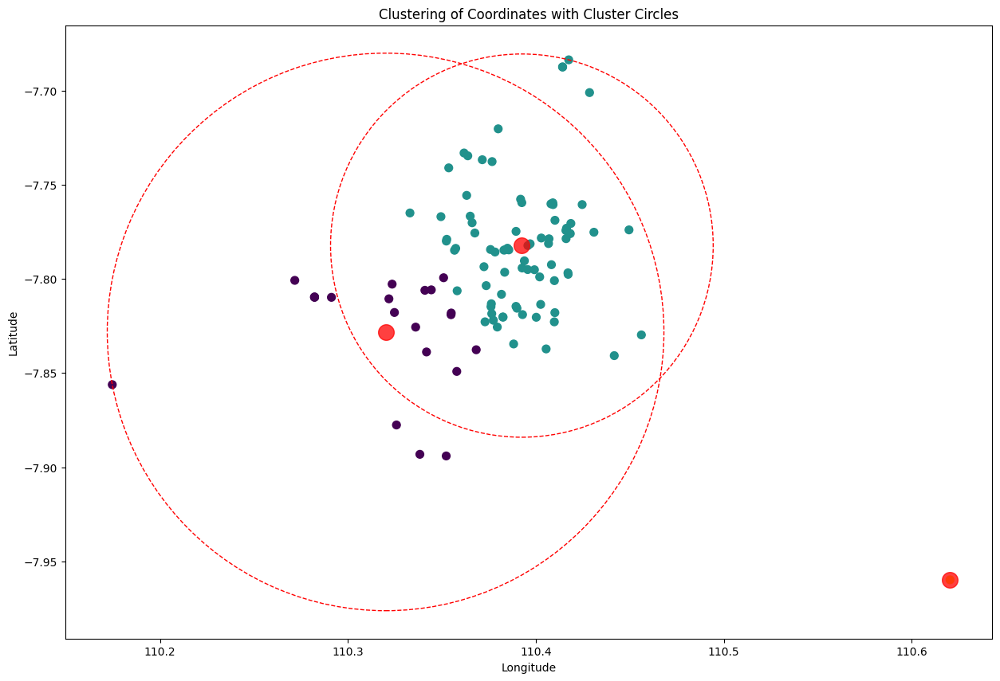

    Daftar Alamat Perguruan Tinggi  \
0                          Kode PT   
1                           051001   
2                           051002   
3                           051003   
4                           051004   
..                             ...   
98                          055012   
99                          055013   
100                         055014   
101                         055015   
102                         056001   

                                       Unnamed: 1  \
0                                         Nama PT   
1                     Universitas Islam Indonesia   
2            Universitas Sarjanawiyata Tamansiswa   
3                           Universitas Janabadra   
4                      Universitas Proklamasi  45   
..                                            ...   
98   Politeknik Kesehatan Karya Husada Yogyakarta   
99             Politeknik Kesehatan Ummi Khasanah   
100                               Politeknik YKPN   
101          

In [60]:
# Membuat model K-Means dengan jumlah cluster 3
kmeans = KMeans(n_clusters=3, random_state=0)
kmeans.fit(coordinates)

# Mendapatkan hasil cluster
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

# Menambahkan hasil cluster ke DataFrame
df['Cluster'] = labels

# Visualisasi hasil clustering
plt.figure(figsize=(15, 10))
plt.scatter(coordinates[:, 1], coordinates[:, 0], c=labels, s=50, cmap='viridis')  # Perhatikan urutan longitude dan latitude
plt.scatter(centroids[:, 1], centroids[:, 0], c='red', s=200, alpha=0.75)  # Perhatikan urutan longitude dan latitude

# Menambahkan lingkaran di sekitar cluster centroids
for i in range(3):
    # Menghitung jarak maksimum dari centroid ke titik-titik dalam cluster
    cluster_points = coordinates[labels == i]
    centroid = centroids[i]
    distances = np.linalg.norm(cluster_points - centroid, axis=1)
    radius = distances.max()

    circle = plt.Circle((centroid[1], centroid[0]), radius, color='red', fill=False, linestyle='--')
    plt.gca().add_patch(circle)

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Clustering of Coordinates with Cluster Circles')
plt.show()

# Menampilkan DataFrame dengan cluster
print(df)

df.to_excel('clustering_4_Jogja_coordinate.xlsx', index=False)

In [62]:
import folium
from folium.plugins import MarkerCluster

# Membuat model K-Means dengan jumlah cluster 6
kmeans = KMeans(n_clusters=6, random_state=0)
kmeans.fit(coordinates)

# Mendapatkan hasil cluster
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

# Menambahkan hasil cluster ke DataFrame
df['Cluster'] = labels

# Visualisasi hasil clustering dengan folium
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
mymap = folium.Map(location=map_center, zoom_start=5)

# Menambahkan marker cluster
marker_cluster = MarkerCluster().add_to(mymap)

# Menambahkan titik data ke peta
for idx, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Cluster: {row['Cluster']}"
    ).add_to(marker_cluster)

# Menambahkan lingkaran di sekitar centroid cluster
for i in range(6):
    # Menghitung jarak maksimum dari centroid ke titik-titik dalam cluster
    cluster_points = coordinates[labels == i]
    centroid = centroids[i]
    distances = np.linalg.norm(cluster_points - centroid, axis=1)
    radius = distances.max()

    folium.Circle(
        location=[centroid[0], centroid[1]],
        radius=radius * 100000,  # Radius dalam meter
        color='red',
        fill=False,
        weight=2,
        dash_array='5'
    ).add_to(mymap)

#Menyimpan peta ke file HTML
mymap.save('clustering Jogja.html')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

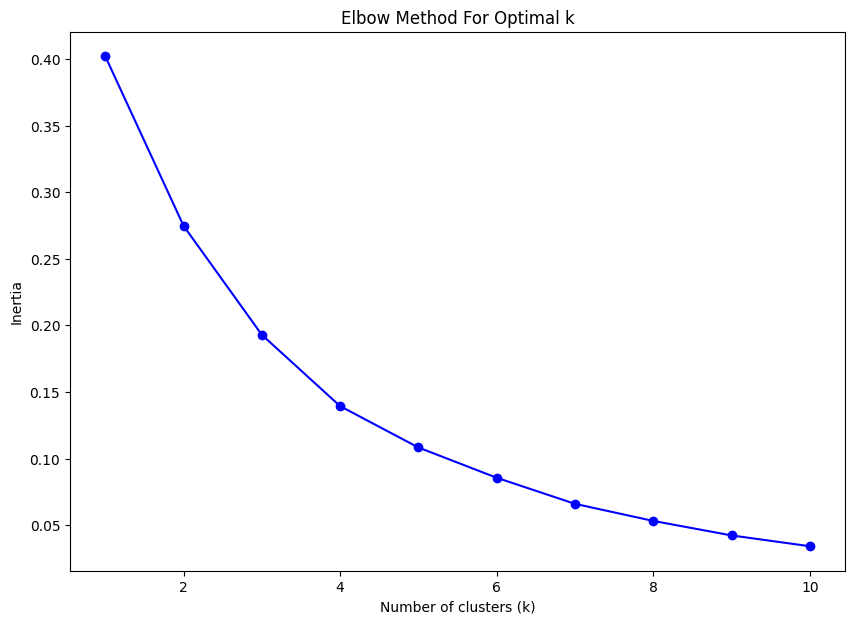

In [65]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Mengganti koma dengan titik dalam kolom 'latitude' dan 'longitude' menggunakan regex
df['Latitude'] = df['Latitude'].astype(str).str.replace(',', '.', regex=True).astype(float)
df['Longitude'] = df['Longitude'].astype(str).str.replace(',', '.', regex=True).astype(float)

# Membuat kolom baru 'coordinate' yang berisi tuple dari 'latitude' dan 'longitude'
df['Coordinate'] = list(zip(df['Latitude'], df['Longitude']))

# Mengonversi kolom 'coordinate' menjadi array numpy untuk digunakan dalam clustering
coordinates = np.array(df['Coordinate'].tolist())

# Menggunakan Metode Elbow untuk menentukan jumlah cluster yang optimal
inertia = []
K = range(1, 11)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(coordinates)
    inertia.append(kmeans.inertia_)

# Plot Inertia terhadap Jumlah Cluster
plt.figure(figsize=(10, 7))
plt.plot(K, inertia, 'bo-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k')
plt.show()

# KESIMPULAN DAN PEMBAHASAN

Hasil Clustering ini dapat digunakan untuk bermacam hal misalnya kita dapat mengetahui lokasi strategis mana yang cocok untuk membuka usaha Kosan,Rumah makan budget untuk mahasiswa dan kebutuhan mahasiswa lainya